In [4]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import sweetviz as sv
import plotly.graph_objs as pg
import plotly.figure_factory as ffc
from tensorflow import keras
import matplotlib.pyplot as plt
import seaborn as sns
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Input
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

import category_encoders as ce
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.decomposition import PCA




c:\Users\mraff\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
 #-----------SPRACOVANIE DAT--------------#

df = pd.read_csv("data/dataset_flights.csv")
test_data = pd.read_csv("data/dataset_flights.csv")

# odstranenie stlpcov s identifikatormi
# stlpcec flight ma prilis vela odlisnych hodnot, podobaju sa na identifikatory
# rozhodli sme sa ich odstranit

unique_values_flight = df['flight'].unique()
print(f"Unique words: {unique_values_flight}")
print(f"Number of unique words flight: {len(unique_values_flight)}")

df = df.drop('flight', axis=1)
df = df.drop('ID', axis=1)

# Vyhľadanie duplicitných záznamov
# zistili sme ze v datasete sa nachadza 74 duplikatov

duplicate = df[df.duplicated()]
df = df.drop_duplicates()
print("Number of records in dataset: "+str(len(df)))
print("There are: " + str(len(duplicate)) + " duplicates.")

df = df.drop_duplicates(keep='first', ignore_index=True)


# zistili sme ze v nasom datasete sa nachádza 14k null
# pre dataset nasich rozmerov je to pomerne mali pocet zaznamov a preto sme sa 
# ich rozhodli odstranit
print(f"There are: {df.isnull().sum().sum()} null values in dataset")
print(df.isnull().sum())

# odstranenie NaN
df = df.dropna()

print("Number of records in cleared dataset: "+str(len(df)))

Unique words: ['AI-9517' 'I5-588' 'AI-768' ... '6E-972' 'G8-199' 'SG-5091']
Number of unique words flight: 1439
Number of records in dataset: 49926
There are: 74 duplicates.
There are: 14755 null values in dataset
airline             1493
source_city         1498
departure_time      1474
stops               1451
arrival_time        1446
destination_city    1489
class               1484
duration            1484
days_left           1460
price               1476
dtype: int64
Number of records in cleared dataset: 36933


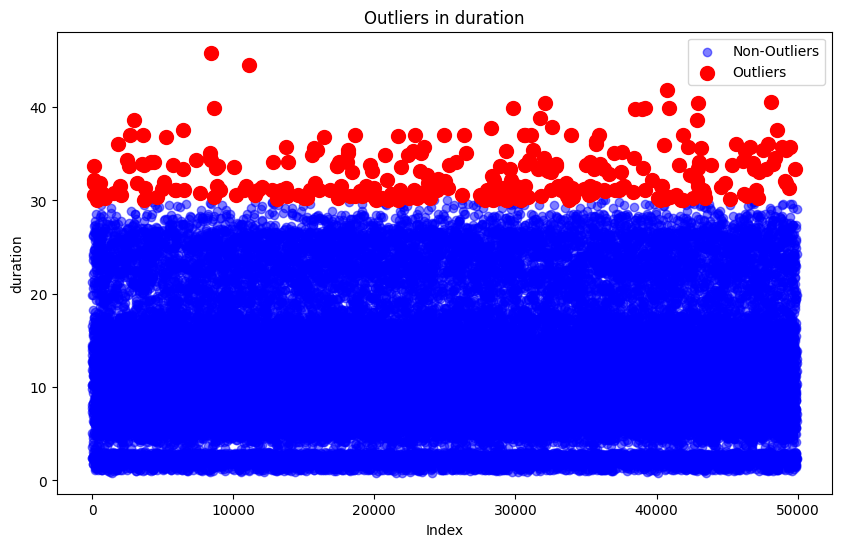

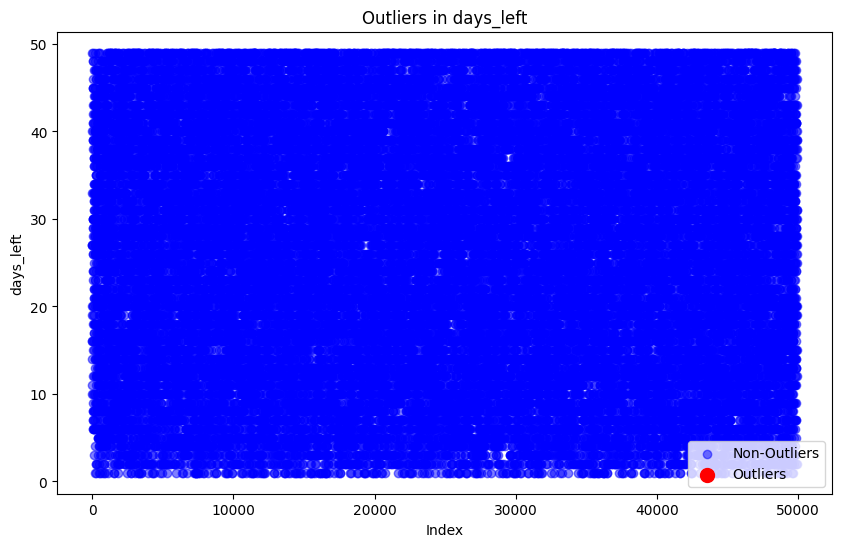

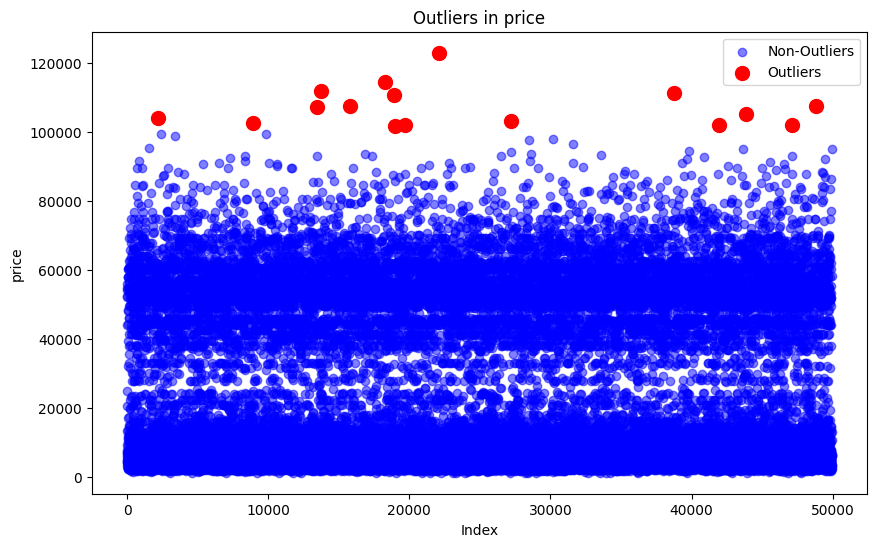

           duration     days_left         price
count  36638.000000  36638.000000  36638.000000
mean      12.117942     25.965992  20980.253071
std        6.975441     13.564432  22694.797082
min        0.830000      1.000000   1105.000000
25%        6.830000     14.000000   4783.000000
50%       11.250000     26.000000   7425.000000
75%       16.080000     38.000000  43270.000000
max       30.000000     49.000000  99577.000000
airline             0
source_city         0
departure_time      0
stops               0
arrival_time        0
destination_city    0
class               0
duration            0
days_left           0
price               0
dtype: int64


In [6]:
numeric_columns = ['duration', 'days_left', 'price']


# Identifikovanie a odstraňovanie outlierov na základe IQR
def detect_and_remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identifikácia outlierov
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    
    # Odstránenie outlierov
    df_clean = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    
    return df_clean, outliers

# Aplikovanie na všetky číselné stĺpce
for column in numeric_columns:
    df, outliers = detect_and_remove_outliers(df, column)
    
    # Vizualizácia výsledkov
    plt.figure(figsize=(10, 6))
    
    plt.scatter(df.index, df[column], color='blue', label='Non-Outliers', alpha=0.5)
    plt.scatter(outliers.index, outliers[column], color='red', label='Outliers', s=100)
    
    plt.title(f"Outliers in {column}")
    plt.xlabel("Index")
    plt.ylabel(column)
    plt.legend()
    plt.show()

# Kontrola dát
print(df.describe())

print(df.isnull().sum())



In [7]:
# spracovanie neciselnych stlpcov

print(df.isnull().sum())


unique_values_cloud = df['airline'].unique()
print(f"Unique words: {unique_values_cloud}")
print(f"Number of unique words airline: {len(unique_values_cloud)}")

unique_values_cloud = df['source_city'].unique()
print(f"Unique words: {unique_values_cloud}")
print(f"Number of unique words source_city: {len(unique_values_cloud)}")

unique_values_cloud = df['destination_city'].unique()
print(f"Unique words: {unique_values_cloud}")
print(f"Number of unique words destination_city: {len(unique_values_cloud)}")

unique_values_cloud = df['arrival_time'].unique()
print(f"Unique words: {unique_values_cloud}")
print(f"Number of unique words arrival_time: {len(unique_values_cloud)}")

unique_values_cloud = df['departure_time'].unique()
print(f"Unique words: {unique_values_cloud}")
print(f"Number of unique words departure_time: {len(unique_values_cloud)}")

unique_values_cloud = df['stops'].unique()
print(f"Unique words: {unique_values_cloud}")
print(f"Number of unique words stops: {len(unique_values_cloud)}")

unique_values_cloud = df['class'].unique()
print(f"Unique words: {unique_values_cloud}")
print(f"Number of unique words class: {len(unique_values_cloud)}")

airline             0
source_city         0
departure_time      0
stops               0
arrival_time        0
destination_city    0
class               0
duration            0
days_left           0
price               0
dtype: int64
Unique words: ['Air_India' 'AirAsia' 'Vistara' 'GO_FIRST' 'Indigo' 'SpiceJet']
Number of unique words airline: 6
Unique words: ['Bangalore' 'Kolkata' 'Mumbai' 'Chennai' 'Hyderabad' 'Delhi']
Number of unique words source_city: 6
Unique words: ['Mumbai' 'Delhi' 'Chennai' 'Bangalore' 'Kolkata' 'Hyderabad']
Number of unique words destination_city: 6
Unique words: ['Night' 'Late_Night' 'Early_Morning' 'Evening' 'Afternoon' 'Morning']
Number of unique words arrival_time: 6
Unique words: ['Evening' 'Afternoon' 'Night' 'Morning' 'Early_Morning' 'Late_Night']
Number of unique words departure_time: 6
Unique words: ['two_or_more' 'one' 'zero']
Number of unique words stops: 3
Unique words: ['Economy' 'Business']
Number of unique words class: 2


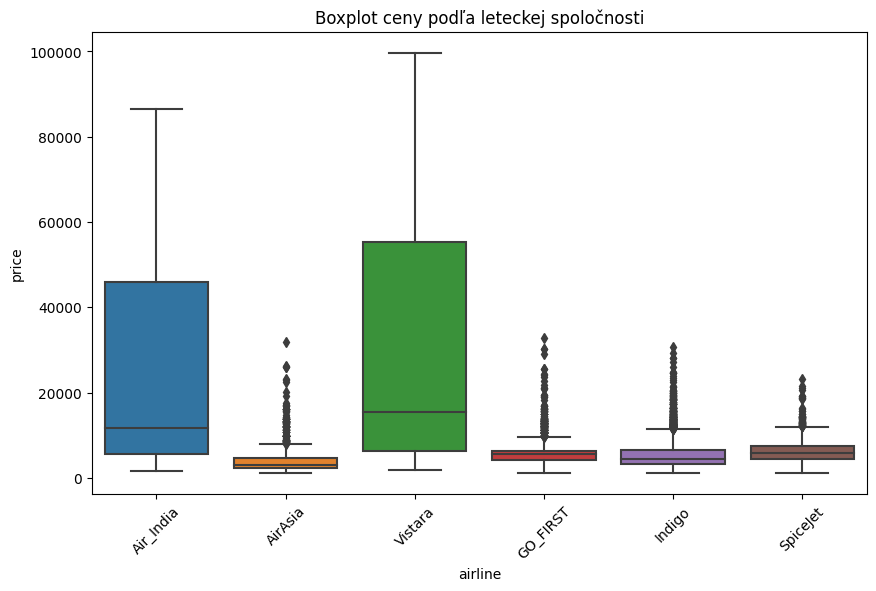

In [132]:
# Boxplot pre 'price' podľa 'airline'
plt.figure(figsize=(10, 6))
sns.boxplot(x='airline', y='price', data=df)
plt.title("Boxplot ceny podľa leteckej spoločnosti")
plt.xticks(rotation=45)
plt.show()

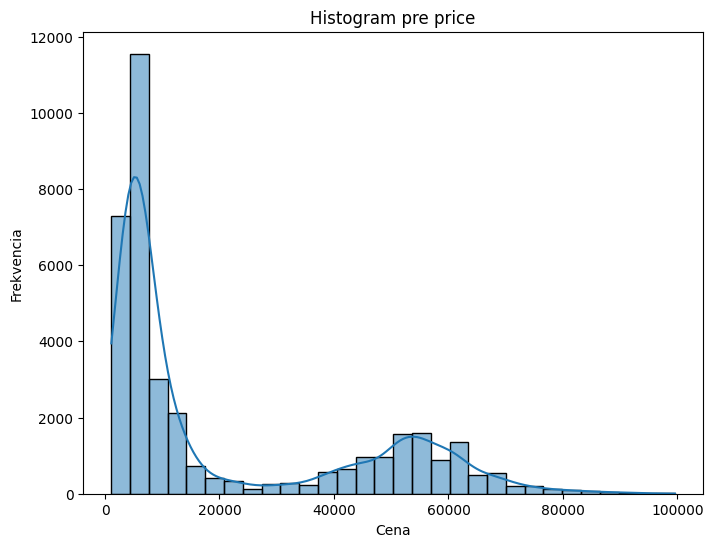

In [7]:
# Histogram pre 'price'
plt.figure(figsize=(8, 6))
sns.histplot(df['price'], bins=30, kde=True)
plt.title("Histogram pre price")
plt.xlabel('Cena')
plt.ylabel('Frekvencia')
plt.show()


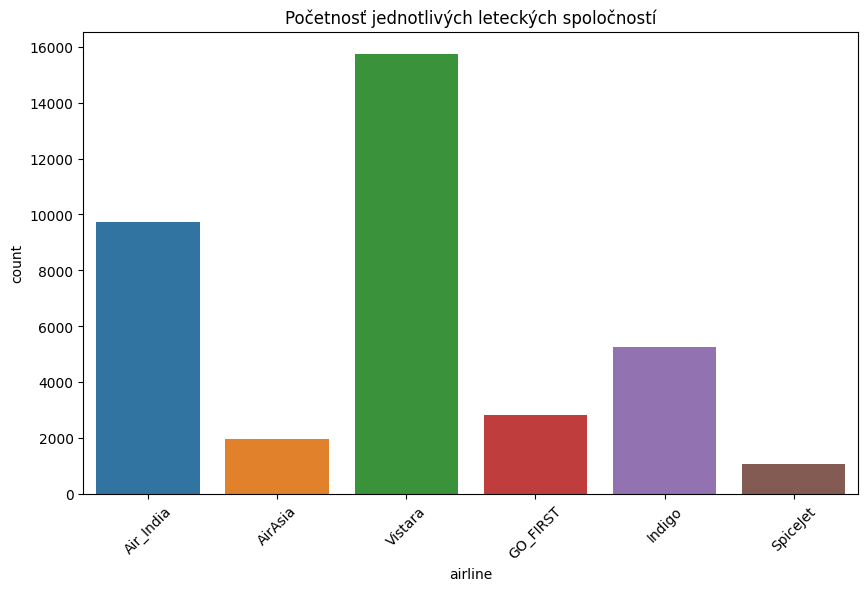

In [134]:
# Countplot pre 'airline'
plt.figure(figsize=(10, 6))
sns.countplot(x='airline', data=df)
plt.title("Početnosť jednotlivých leteckých spoločností")
plt.xticks(rotation=45)
plt.show()


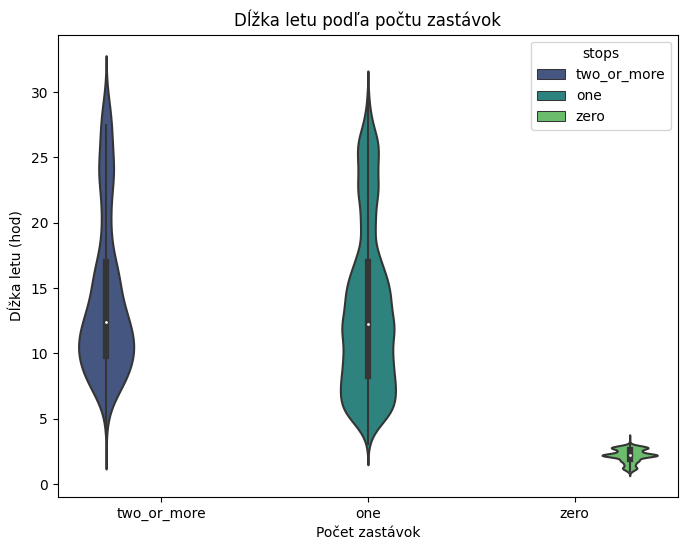

In [8]:
# Scatterplot pre duration a počet zastávok
plt.figure(figsize=(8, 6))
sns.violinplot(x='stops', y='duration', data=df, hue='stops', palette='viridis')
plt.title("Dĺžka letu podľa počtu zastávok")
plt.xlabel('Počet zastávok')
plt.ylabel('Dĺžka letu (hod)')
plt.show()


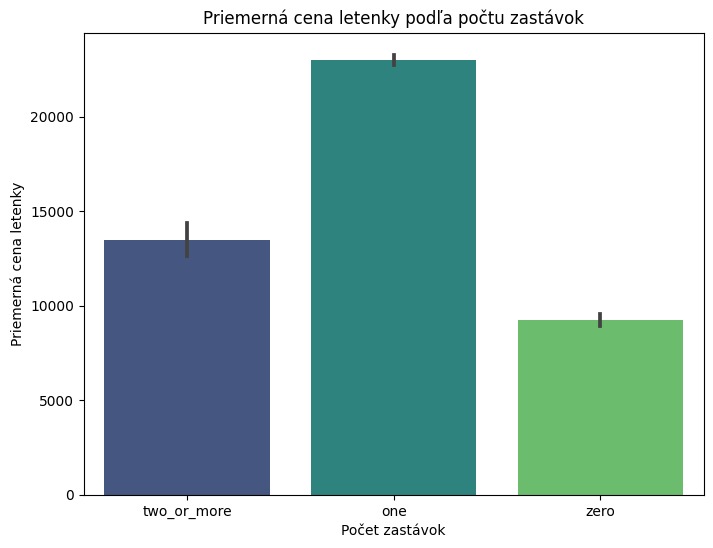

In [136]:
# Bar plot pre cenu podľa počtu zastávok
plt.figure(figsize=(8, 6))
sns.barplot(x='stops', y='price', data=df, palette='viridis')
plt.title("Priemerná cena letenky podľa počtu zastávok")
plt.xlabel('Počet zastávok')
plt.ylabel('Priemerná cena letenky')
plt.show()


In [8]:
# na stlpec class a stops sme vybrali druh zakódovania One-Hot Encoding
# One-Hot Encoding na stĺpec 'class'
df_one_hot = pd.get_dummies(df['class'], prefix='class')
df = pd.concat([df, df_one_hot], axis=1)

# Odstránenie pôvodného stĺpca 'class'
df = df.drop(columns=['class'])

df_one_hot = pd.get_dummies(df['stops'], prefix='stops')
df = pd.concat([df, df_one_hot], axis=1)

# Odstránenie pôvodného stĺpca 'stops'
df = df.drop(columns=['stops'])

target_encoder = ce.TargetEncoder(cols=['airline', 'source_city', 'destination_city', 'arrival_time', 'departure_time'])
df_encoded = target_encoder.fit_transform(df, df['price'].astype(float))

df = df_encoded

# Výsledný DataFrame
print(df.describe())

# Zobrazenie dátových typov každého stĺpca
print(df.dtypes)


            airline   source_city  departure_time  arrival_time  \
count  36638.000000  36638.000000    36638.000000  36638.000000   
mean   20980.253071  20980.253071    20980.253085  20980.253071   
std    10690.067067   1210.750514     1768.757425   3065.487825   
min     4117.230223  19057.132421     9700.172713  10765.182898   
25%     5793.299190  20134.387893    20207.809601  21531.553311   
50%    23925.611065  20896.746518    21385.901002  21531.553311   
75%    30269.613053  22243.843117    21638.245332  23383.458143   
max    30269.613053  22391.796577    23541.517594  23383.458143   

       destination_city      duration     days_left         price  \
count      36638.000000  36638.000000  36638.000000  36638.000000   
mean       20980.253071     12.117942     25.965992  20980.253071   
std         1371.763800      6.975441     13.564432  22694.797082   
min        18352.874462      0.830000      1.000000   1105.000000   
25%        20595.583704      6.830000     14.000000

In [7]:
# Oddelíme vstupy (X) a výstupy (y)
X = df.drop(columns=['price'])  # 'price' je naša cieľová premenná (output)
y = df['price']

# Rozdelenie dát na tréningovú a testovaciu množinu (80% tréning, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizácia vstupných dát (len X_train a X_test)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Normalizujeme len na základe tréningových dát
X_test_scaled = scaler.transform(X_test)  # Testovacie dáta normalizujeme pomocou rovnakého scaleru

# Výsledky sú v X_train_scaled, X_test_scaled, y_train, a y_test
print("X_train_scaled shape:", X_train_scaled.shape)
print("X_test_scaled shape:", X_test_scaled.shape)


X_train_scaled shape: (29310, 12)
X_test_scaled shape: (7328, 12)


Decision Tree - Training MSE: 27279.455510064825, R2: 0.9999469905395372
Decision Tree - Testing MSE: 18747532.574986354, R2: 0.9637193564462807


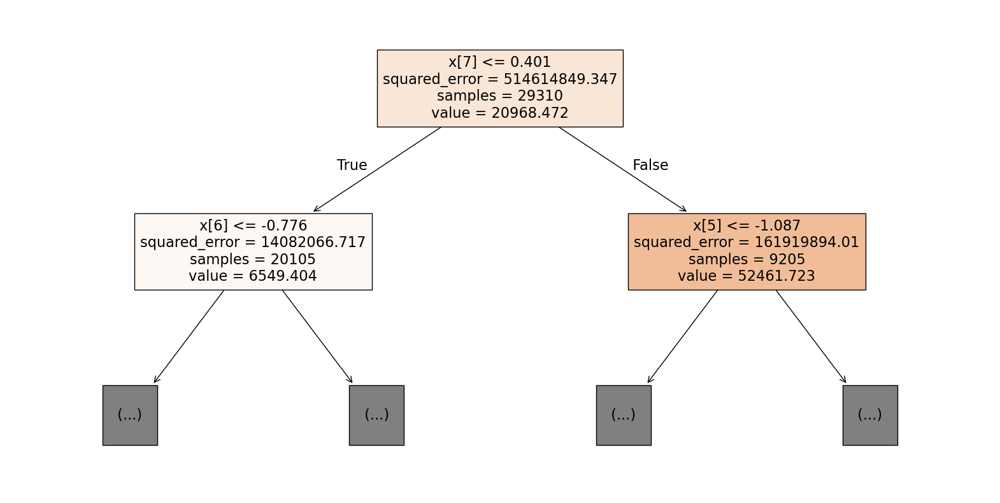

In [9]:
# Tréning rozhodovacieho stromu
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train_scaled, y_train)

# Predikcie a vyhodnotenie
y_train_pred_tree = tree_model.predict(X_train_scaled)
y_test_pred_tree = tree_model.predict(X_test_scaled)

# Výpočet MSE a R2 skóre
mse_train_tree = mean_squared_error(y_train, y_train_pred_tree)
mse_test_tree = mean_squared_error(y_test, y_test_pred_tree)
r2_train_tree = r2_score(y_train, y_train_pred_tree)
r2_test_tree = r2_score(y_test, y_test_pred_tree)

# Výsledky
print(f"Decision Tree - Training MSE: {mse_train_tree}, R2: {r2_train_tree}")
print(f"Decision Tree - Testing MSE: {mse_test_tree}, R2: {r2_test_tree}")

# Zobrazenie stromu
plt.figure(figsize=(20, 10))
plot_tree(tree_model, filled=True, max_depth=1)  # max_depth=3 pre zjednodušenú vizualizáciu
plt.show()

Random Forest - Training MSE: 1606297.252123743, R2: 0.9968786418538802
Random Forest - Testing MSE: 10843157.96796327, R2: 0.9790160786408111


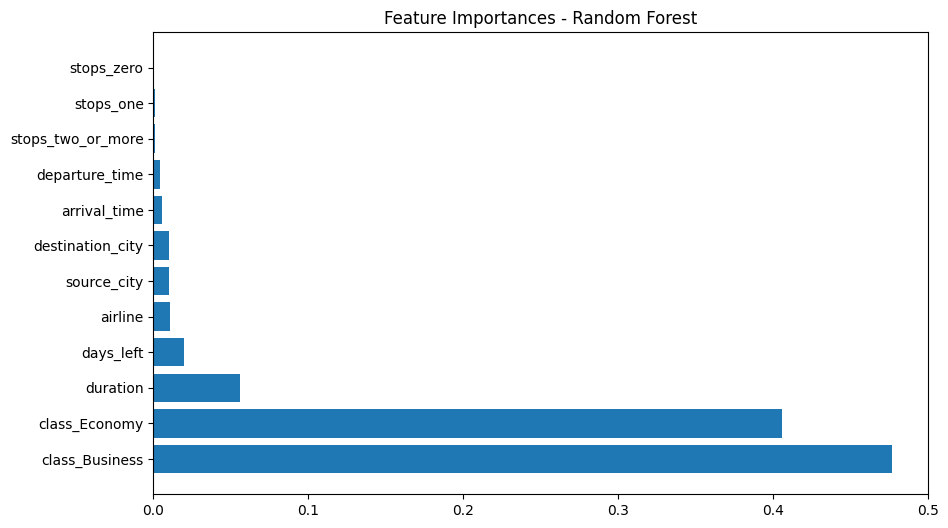

In [12]:
# Tréning Random Forest modelu
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Predikcie a vyhodnotenie
y_train_pred_rf = rf_model.predict(X_train_scaled)
y_test_pred_rf = rf_model.predict(X_test_scaled)

# Výpočet MSE a R2 skóre
mse_train_rf = mean_squared_error(y_train, y_train_pred_rf)
mse_test_rf = mean_squared_error(y_test, y_test_pred_rf)
r2_train_rf = r2_score(y_train, y_train_pred_rf)
r2_test_rf = r2_score(y_test, y_test_pred_rf)

# Výsledky
print(f"Random Forest - Training MSE: {mse_train_rf}, R2: {r2_train_rf}")
print(f"Random Forest - Testing MSE: {mse_test_rf}, R2: {r2_test_rf}")

# Vizualizácia dôležitosti vstupných parametrov
importances = rf_model.feature_importances_
indices = importances.argsort()[::-1]  # zoradenie podľa dôležitosti

plt.figure(figsize=(10, 6))
plt.title("Feature Importances - Random Forest")
plt.barh(range(len(importances)), importances[indices], align="center")
plt.yticks(range(len(importances)), [X.columns[i] for i in indices])
plt.show()

In [82]:
# Tréning SVM modelu
svm_model = SVR(kernel='rbf')
svm_model.fit(X_train_scaled, y_train)

# Predikcie a vyhodnotenie
y_train_pred_svm = svm_model.predict(X_train_scaled)
y_test_pred_svm = svm_model.predict(X_test_scaled)

# Výpočet MSE a R2 skóre
mse_train_svm = mean_squared_error(y_train, y_train_pred_svm)
mse_test_svm = mean_squared_error(y_test, y_test_pred_svm)
r2_train_svm = r2_score(y_train, y_train_pred_svm)
r2_test_svm = r2_score(y_test, y_test_pred_svm)

# Výsledky
print(f"SVM - Training MSE: {mse_train_svm}, R2: {r2_train_svm}")
print(f"SVM - Testing MSE: {mse_test_svm}, R2: {r2_test_svm}")

SVM - Training MSE: 597870884.4390804, R2: -0.16178319610798786
SVM - Testing MSE: 600337180.9603478, R2: -0.1617859143516054


In [10]:
# Tréning SVM modelu s nastavenými hyperparametrami
svm_model = SVR(kernel='rbf', C=100, gamma='scale')
svm_model.fit(X_train_scaled, y_train)

# Predikcie a vyhodnotenie
y_train_pred_svm = svm_model.predict(X_train_scaled)
y_test_pred_svm = svm_model.predict(X_test_scaled)

# Výpočet MSE a R2 skóre
mse_train_svm = mean_squared_error(y_train, y_train_pred_svm)
mse_test_svm = mean_squared_error(y_test, y_test_pred_svm)
r2_train_svm = r2_score(y_train, y_train_pred_svm)
r2_test_svm = r2_score(y_test, y_test_pred_svm)

# Výsledky
print(f"SVM - Training MSE: {mse_train_svm}, R2: {r2_train_svm}")
print(f"SVM - Testing MSE: {mse_test_svm}, R2: {r2_test_svm}")


SVM - Training MSE: 47028577.86411703, R2: 0.9086140286783702
SVM - Testing MSE: 43036832.76966143, R2: 0.9167141604820896


In [84]:
# Definovanie parametrov pre doladenie
param_grid = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'gamma': ['scale', 'auto']  # Pre rbf, poly
}

# Vytvorenie SVM modelu
svm_model = SVR()

# Vykonanie Grid Search
grid_search = GridSearchCV(svm_model, param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

# Najlepšie parametre a model
best_svm_model = grid_search.best_estimator_
print("Najlepšie parametre pre SVM:", grid_search.best_params_)

# Predikcie a vyhodnotenie
y_train_pred_best_svm = best_svm_model.predict(X_train_scaled)
y_test_pred_best_svm = best_svm_model.predict(X_test_scaled)

# Výpočet MSE a R2 skóre
mse_train_best_svm = mean_squared_error(y_train, y_train_pred_best_svm)
mse_test_best_svm = mean_squared_error(y_test, y_test_pred_best_svm)
r2_train_best_svm = r2_score(y_train, y_train_pred_best_svm)
r2_test_best_svm = r2_score(y_test, y_test_pred_best_svm)

# Výsledky
print(f"SVM - Training MSE: {mse_train_best_svm}, R2: {r2_train_best_svm}")
print(f"SVM - Testing MSE: {mse_test_best_svm}, R2: {r2_test_best_svm}")

Najlepšie parametre pre SVM: {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
SVM - Training MSE: 47028577.86411703, R2: 0.9086140286783702
SVM - Testing MSE: 43036832.76966143, R2: 0.9167141604820896


In [85]:
# Vytvorenie DataFrame z výsledkov Grid Search
results_df = pd.DataFrame(grid_search.cv_results_)

# Zobrazíme všetky hodnoty vrátane priemernej R2 pre každý parameter
print(results_df[['param_kernel', 'param_C', 'param_gamma', 'mean_test_score', 'std_test_score', 'rank_test_score']])

# Najlepšie parametre a model
best_svm_model = grid_search.best_estimator_
print("Najlepšie parametre pre SVM:", grid_search.best_params_)

# Predikcie a vyhodnotenie pre najlepší model
y_train_pred_best_svm = best_svm_model.predict(X_train_scaled)
y_test_pred_best_svm = best_svm_model.predict(X_test_scaled)

# Výpočet MSE a R2 skóre
mse_train_best_svm = mean_squared_error(y_train, y_train_pred_best_svm)
mse_test_best_svm = mean_squared_error(y_test, y_test_pred_best_svm)
r2_train_best_svm = r2_score(y_train, y_train_pred_best_svm)
r2_test_best_svm = r2_score(y_test, y_test_pred_best_svm)

# Výsledky
print(f"SVM - Training MSE: {mse_train_best_svm}, R2: {r2_train_best_svm}")
print(f"SVM - Testing MSE: {mse_test_best_svm}, R2: {r2_test_best_svm}")

   param_kernel  param_C param_gamma  mean_test_score  std_test_score  \
0        linear      0.1       scale         0.047610        0.020124   
1          poly      0.1       scale        -0.344329        0.022998   
2           rbf      0.1       scale        -0.340798        0.022486   
3       sigmoid      0.1       scale        -0.321176        0.022353   
4        linear      0.1        auto         0.047610        0.020124   
5          poly      0.1        auto        -0.344334        0.022953   
6           rbf      0.1        auto        -0.340797        0.022492   
7       sigmoid      0.1        auto        -0.321178        0.022315   
8        linear      1.0       scale         0.861336        0.003571   
9          poly      1.0       scale        -0.249108        0.023777   
10          rbf      1.0       scale        -0.200431        0.021961   
11      sigmoid      1.0       scale        -0.038087        0.021276   
12       linear      1.0        auto         0.8613

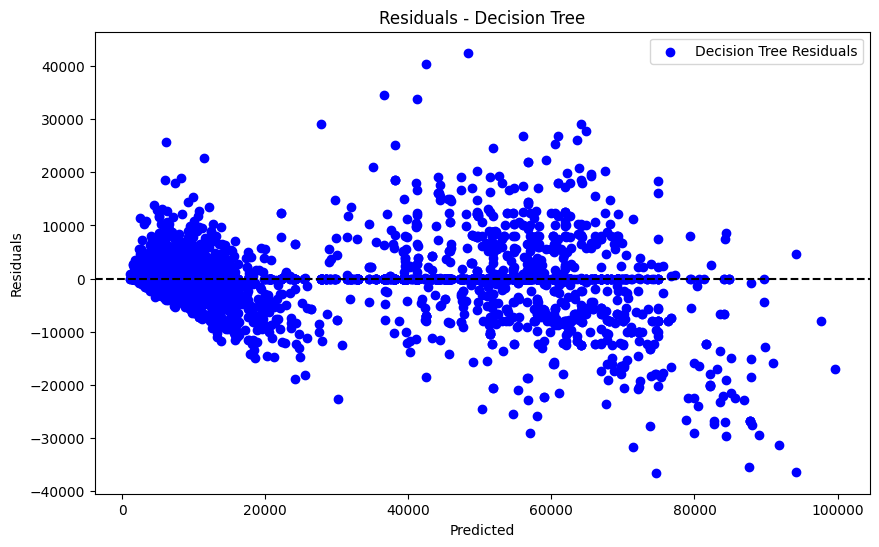

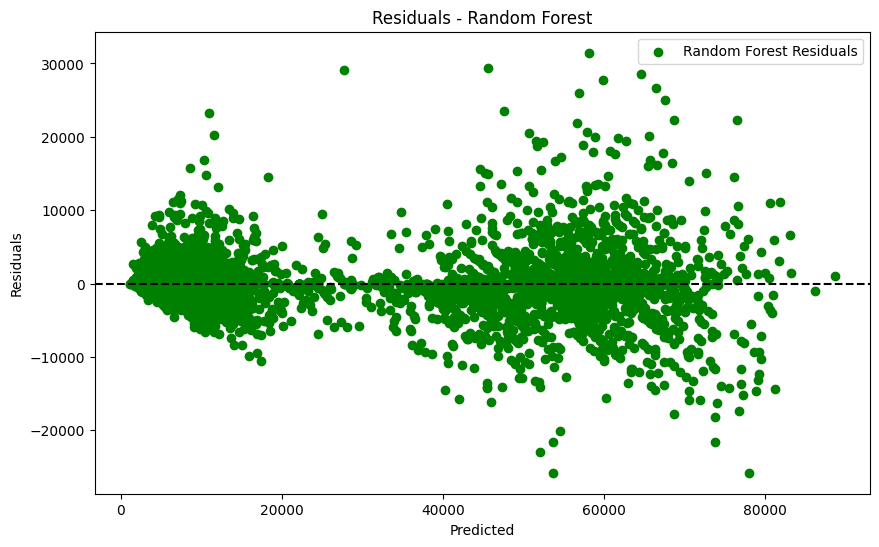

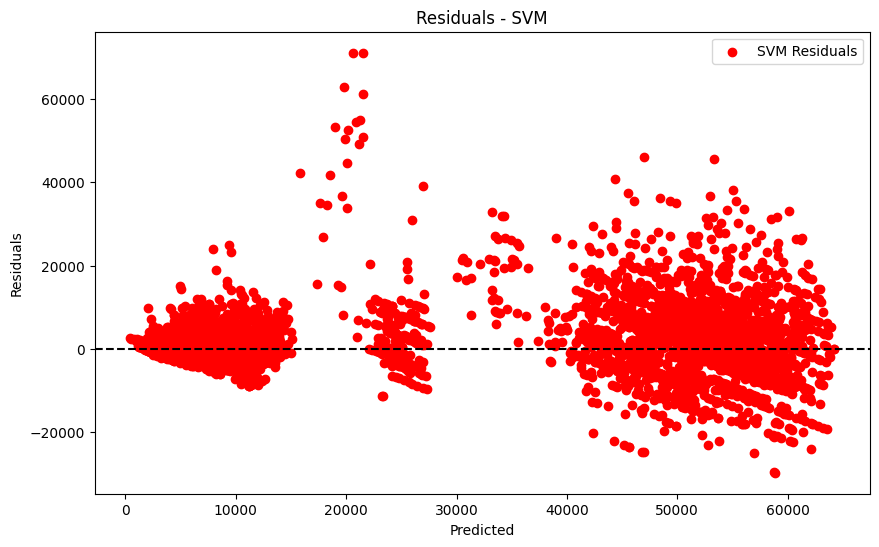

In [13]:
# Reziduály pre každý model
residuals_tree = y_test - y_test_pred_tree
residuals_rf = y_test - y_test_pred_rf
residuals_svm = y_test - y_test_pred_svm

# Vizualizácia reziduálov pre rozhodovací strom
plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred_tree, residuals_tree, color='blue', label='Decision Tree Residuals')
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals - Decision Tree')
plt.legend()
plt.show()

# Vizualizácia reziduálov pre Random Forest
plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred_rf, residuals_rf, color='green', label='Random Forest Residuals')
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals - Random Forest')
plt.legend()
plt.show()

# Vizualizácia reziduálov pre SVM
plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred_svm, residuals_svm, color='red', label='SVM Residuals')
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals - SVM')
plt.legend()
plt.show()


In [14]:
# y obsahuje výstupnú premennú (cenu)

# Vyber tri príznaky pre vizualizáciu
fig = px.scatter_3d(X, x='class_Business', y='class_Economy', z='duration', color=y, 
                    labels={'color': 'price'})

# Zobrazenie grafu
fig.show()

In [97]:
# Vytvorenie 3D scatter plotu
fig = go.Figure(data=[go.Scatter3d(
    x=X['class_Business'], 
    y=X['class_Economy'], 
    z=X['duration'], 
    mode='markers',
    marker=dict(
        size=5,
        color=y,  # Zafarbíme podľa výstupnej premennej (cena)
        colorscale='Viridis',  # Farebná mapa
        opacity=0.8
    )
)])

# Úprava layoutu grafu
fig.update_layout(scene=dict(
                    xaxis_title='class_Business',
                    yaxis_title='class_Economy',
                    zaxis_title='duration'),
                  title='3D Scatter Plot After Normalization')

# Zobrazenie grafu
fig.show()

In [101]:
# Aplikuj PCA na normalizované dáta (X_train_scaled)
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_train_scaled)

# Vytvorenie DataFrame z PCA výsledkov
X_pca_df = pd.DataFrame(X_pca, columns=['x', 'y', 'z'])

# Zobrazenie 3D scatter plotu po PCA
fig = px.scatter_3d(X_pca_df, x='x', y='y', z='z', 
                    color=y_train, labels={'color': 'Cena'}, title='3D Scatter Plot After PCA')

# Zobrazenie grafu
fig.show()

In [102]:
# EDA 

# korelacna matica
corr_matrix = px.imshow(df.corr())
corr_matrix.show()

In [140]:
# Compute correlation matrix
correlation_matrix = df.corr()
target_corr = correlation_matrix['price'].abs().sort_values(ascending=False)

# Select features based on correlation 
selected_features_corr = target_corr[target_corr > 0.5].index.tolist()
selected_features_corr.remove('price')

# Subset of data
X_corr = df[selected_features_corr]

# Split and scale the data
X_train_corr, X_test_corr, y_train_corr, y_test_corr = train_test_split(X_corr, y, test_size=0.2, random_state=42)
X_train_corr_scaled = scaler.fit_transform(X_train_corr)
X_test_corr_scaled = scaler.transform(X_test_corr)

# Retrain the Decision Tree model
tree_model_corr = DecisionTreeRegressor(random_state=42)
tree_model_corr.fit(X_train_corr_scaled, y_train_corr)

# Predictions and evaluation
y_train_pred_corr = tree_model_corr.predict(X_train_corr_scaled)
y_test_pred_corr = tree_model_corr.predict(X_test_corr_scaled)
mse_test_corr = mean_squared_error(y_test_corr, y_test_pred_corr)
r2_test_corr = r2_score(y_test_corr, y_test_pred_corr)


In [141]:
# Train a RandomForest to get feature importance
ensemble_model = RandomForestRegressor(random_state=42)
ensemble_model.fit(X_train_scaled, y_train)

# Get top features by importance
feature_importances = pd.Series(ensemble_model.feature_importances_, index=X.columns)
selected_features_ensemble = feature_importances.nlargest(5).index.tolist()

# Subset of data
X_ensemble = df[selected_features_ensemble]

# Split and scale the data
X_train_ensemble, X_test_ensemble, y_train_ensemble, y_test_ensemble = train_test_split(X_ensemble, y, test_size=0.2, random_state=42)
X_train_ensemble_scaled = scaler.fit_transform(X_train_ensemble)
X_test_ensemble_scaled = scaler.transform(X_test_ensemble)

# Retrain the Decision Tree model
tree_model_ensemble = DecisionTreeRegressor(random_state=42)
tree_model_ensemble.fit(X_train_ensemble_scaled, y_train_ensemble)

# Predictions and evaluation
y_train_pred_ensemble = tree_model_ensemble.predict(X_train_ensemble_scaled)
y_test_pred_ensemble = tree_model_ensemble.predict(X_test_ensemble_scaled)
mse_test_ensemble = mean_squared_error(y_test_ensemble, y_test_pred_ensemble)
r2_test_ensemble = r2_score(y_test_ensemble, y_test_pred_ensemble)


In [17]:

# Standardize the data before applying PCA
X_scaled = scaler.fit_transform(X)

# Apply PCA and retain 95% of variance
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

# Split the PCA-transformed data
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Retrain the Decision Tree model
tree_model_pca = DecisionTreeRegressor(random_state=42)
tree_model_pca.fit(X_train_pca, y_train_pca)

# Predictions and evaluation
y_train_pred_pca = tree_model_pca.predict(X_train_pca)
y_test_pred_pca = tree_model_pca.predict(X_test_pca)
mse_test_pca = mean_squared_error(y_test_pca, y_test_pred_pca)
r2_test_pca = r2_score(y_test_pca, y_test_pred_pca)


In [143]:
results = pd.DataFrame({
    'Method': ['Correlation', 'Ensemble Importance', 'PCA'],
    'MSE': [mse_test_corr, mse_test_ensemble, mse_test_pca],
    'R²': [r2_test_corr, r2_test_ensemble, r2_test_pca]
})

print(results)


                Method           MSE        R²
0          Correlation  5.899086e+07  0.885840
1  Ensemble Importance  4.604486e+07  0.910893
2                  PCA  2.913474e+07  0.943618


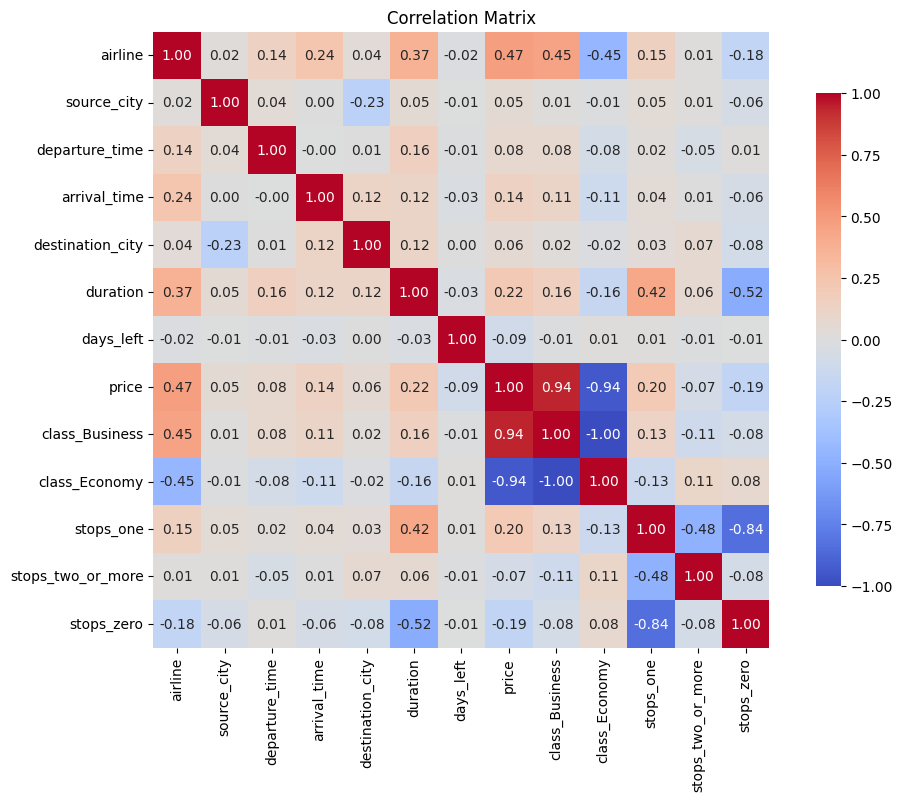

In [144]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix")
plt.show()

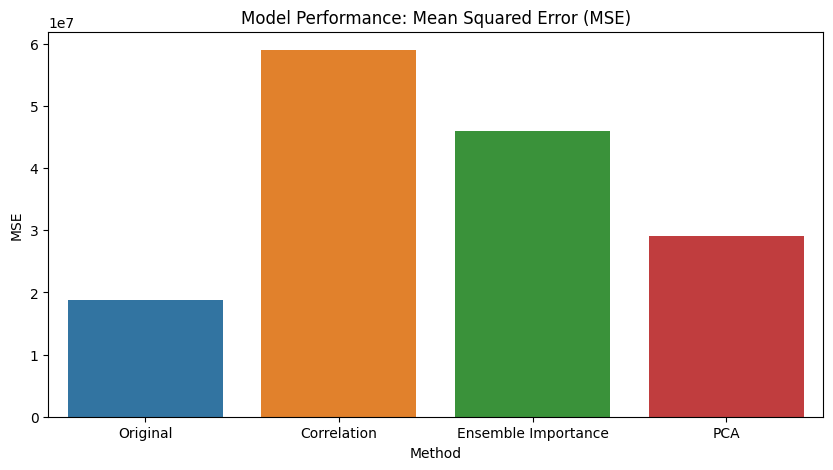

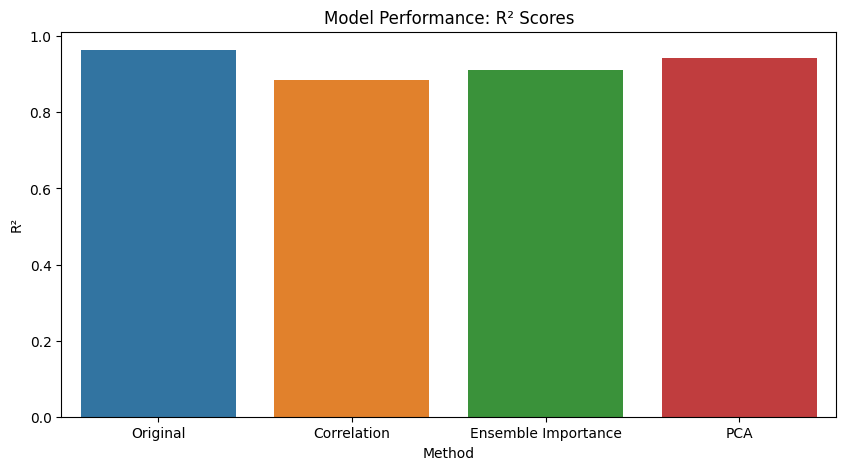

In [145]:
# Gather results for plotting
results = pd.DataFrame({
    'Method': ['Original', 'Correlation', 'Ensemble Importance', 'PCA'],
    'MSE': [mse_test_tree, mse_test_corr, mse_test_ensemble, mse_test_pca],
    'R²': [r2_test_tree, r2_test_corr, r2_test_ensemble, r2_test_pca]
})

# Plotting MSE
plt.figure(figsize=(10, 5))
sns.barplot(x='Method', y='MSE', data=results)
plt.title("Model Performance: Mean Squared Error (MSE)")
plt.ylabel("MSE")
plt.show()

# Plotting R²
plt.figure(figsize=(10, 5))
sns.barplot(x='Method', y='R²', data=results)
plt.title("Model Performance: R² Scores")
plt.ylabel("R²")
plt.show()


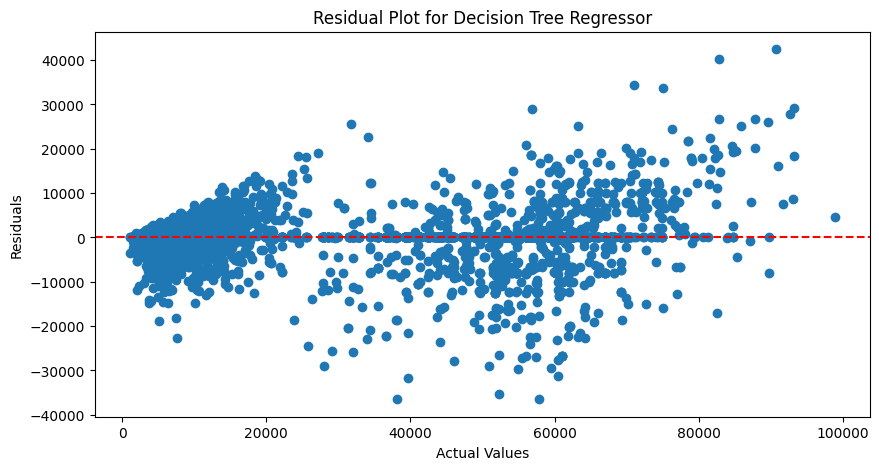

In [146]:
# Residuals for the original model
residuals_tree = y_test - y_test_pred_tree

plt.figure(figsize=(10, 5))
plt.scatter(y_test, residuals_tree)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residual Plot for Decision Tree Regressor")
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.show()


In [18]:
from sklearn.cluster import KMeans

# Predpokladajme, že máte normalizované dáta X_scaled
# Vytvorenie K-means modelu s 3 zhlukmi
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Pridanie zhlukov do DataFrame
X_clustered = pd.DataFrame(X_scaled, columns=X.columns)
X_clustered['Cluster'] = clusters

# Zobrazenie zhlukov v 3D grafe
fig = px.scatter_3d(X_clustered, x='class_Business', y='class_Economy', z='duration', 
                    color='Cluster', title='Zhlukovanie dát v 3D')
fig.show()

c:\Users\mraff\AppData\Local\Programs\Python\Python310\lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning:

Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "c:\Users\mraff\AppData\Local\Programs\Python\Python310\lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


In [22]:
results = []

# Iterácia cez každý zhluk
for cluster in np.unique(clusters):
    # Výber dát pre aktuálny zhluk
    cluster_data = X_clustered[X_clustered['Cluster'] == cluster]

    # Odstránenie výstupnej premennej (cena) a zhlukov
    X_cluster = cluster_data.drop(columns=['Cluster', 'cena'])
    y_cluster = cluster_data['cena']  # Predpokladáme, že máte stĺpec 'price'

    # Rozdelenie dát na tréningovú a testovaciu množinu
    X_train, X_test, y_train, y_test = train_test_split(X_cluster, y_cluster, test_size=0.2, random_state=42)

    # Trénovanie modelu
    model = DecisionTreeRegressor(random_state=42)  # alebo iný model
    model.fit(X_train, y_train)

    # Predikcia a vyhodnotenie modelu
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Uloženie výsledkov
    results.append({'Cluster': cluster, 'MSE': mse, 'R2': r2})

# Zobrazenie výsledkov
results_df = pd.DataFrame(results)
print(results_df)

KeyError: "['cena'] not found in axis"

In [9]:
# Oddelíme vstupy (X) a výstupy (y)
X = df.drop(columns=['price'])  # 'price' je naša cieľová premenná (output)
Y = df['price']

# Najprv rozdelíme dáta na trénovaciu a testovaciu množinu (60% tréning, 40% test)
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.3, random_state=42)

# Potom rozdelíme trénovaciu množinu na tréningovú a validačnú množinu (50% tréning, 50% validačná)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp , Y_temp, test_size=0.50, random_state=42)

# Normalizácia dát
scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Vytvorenie dátového rámca s názvami stĺpcov po normalizácii
X_train_df = pd.DataFrame(X_train, columns=X.columns)  # Uistite sa, že X má názvy stĺpcov


In [14]:

# Definícia modelu
def create_model():
    model = Sequential()
    model.add(Dense(64, input_shape=(X_train.shape[1],), activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))  # Regresná výstupná vrstva

    # Kompilácia modelu pre regresiu
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error', metrics=['mae'])
    return model


model = create_model()

# Trénovanie modelu
history = model.fit(X_train, Y_train, epochs=100, validation_data=(X_val, Y_val), batch_size=32)





Epoch 1/100


c:\Users\mraff\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 431459200.0000 - mae: 13587.1807 - val_loss: 39470732.0000 - val_mae: 3966.6711
Epoch 2/100
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 36029864.0000 - mae: 3827.2417 - val_loss: 36546916.0000 - val_mae: 3797.6240
Epoch 3/100
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 33155664.0000 - mae: 3644.9617 - val_loss: 35455672.0000 - val_mae: 3702.9111
Epoch 4/100
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 31769132.0000 - mae: 3501.8279 - val_loss: 34378796.0000 - val_mae: 3642.7817
Epoch 5/100
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 30175418.0000 - mae: 3409.2017 - val_loss: 33885788.0000 - val_mae: 3581.7483
Epoch 6/100
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 31400386.0000 - mae: 3456.5955 - val_loss: 33577692.0000 - val_mae: 3527.6299
Epoch 7/100
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 29402412.0000 - mae: 3307.1763 - val_loss: 32900068.0000 - val_mae: 3489.0681
Epoch 8/100
802/802 ━━━━━━━

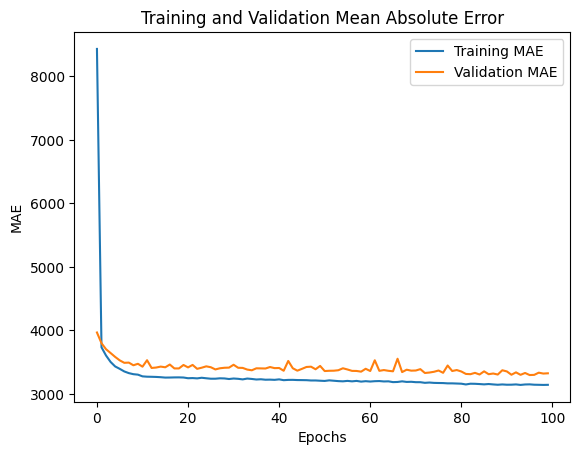

In [15]:
# Zobrazenie priebehu trénovania pre Mean Absolute Error (MAE)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Training and Validation Mean Absolute Error')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()
plt.show()

In [ ]:
# Funkcia na vytvorenie modelu
def create_model(units1=64, units2=32, learning_rate=0.01):
    model = Sequential()
    model.add(Dense(units1, input_shape=(X_train.shape[1],), activation='relu'))
    model.add(Dense(units2, activation='relu'))
    model.add(Dense(1, activation='linear'))  # výstup pre regresiu
    
    # Kompilácia modelu
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])
    return model


# Model obalený pre Grid Search
model = KerasRegressor(build_fn=create_model, verbose=0)

# Parametre pre Grid Search
param_grid = {
    'units1': [64, 128],
    'units2': [32, 64],
    'batch_size': [16, 32],
    'epochs': [50, 100],
    'learning_rate': [0.001, 0.01]
}

# Nastavenie Grid Search s krížovou validáciou
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_absolute_error')
grid_result = grid.fit(X_train, Y_train)

# Zobrazenie najlepších parametrov
print("Najlepšie parametre: %s" % grid_result.best_params_)
print("Najlepší MAE: %.2f" % abs(grid_result.best_score_))


In [ ]:
# Definícia funkcie na vytvorenie modelu
def create_model(units1, units2, learning_rate):
    model = Sequential()
    model.add(Dense(units1, input_shape=(X_train.shape[1],), activation='relu'))
    model.add(Dense(units2, activation='relu'))
    model.add(Dense(1, activation='linear'))  # výstup pre regresiu
    
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])
    return model

# Parametre pre ručný Grid Search
param_grid = {
    'units1': [64, 128],
    'units2': [32, 64],
    'learning_rate': [0.001, 0.01],
    'batch_size': [16, 32],
    'epochs': [50, 100]
}

# Inicializácia pre sledovanie najlepších parametrov
best_score = np.inf
best_params = {}

# Manuálny Grid Search
for units1 in param_grid['units1']:
    for units2 in param_grid['units2']:
        for lr in param_grid['learning_rate']:
            for batch_size in param_grid['batch_size']:
                for epochs in param_grid['epochs']:
                    # Vytvorenie a trénovanie modelu
                    model = create_model(units1=units1, units2=units2, learning_rate=lr)
                    history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size, 
                                        validation_data=(X_val, Y_val), verbose=0)

                    # Získanie validačnej MAE z poslednej epochy
                    val_mae = history.history['val_mae'][-1]

                    # Kontrola, či máme lepší výsledok
                    if val_mae < best_score:
                        best_score = val_mae
                        best_params = {
                            'units1': units1,
                            'units2': units2,
                            'learning_rate': lr,
                            'batch_size': batch_size,
                            'epochs': epochs
                        }

# Výsledky najlepších parametrov
print("Najlepšie parametre:", best_params)
print("Najlepší MAE:", best_score)